# Market Sector Data Analysis

In [1]:
# Imports
import os
import pandas as pd
import numpy as np
import datetime as dt
from MCForecastTools import MCSimulation
import alpaca_trade_api as tradeapi
from dotenv import load_dotenv
from pathlib import Path
import matplotlib.pyplot as plt
import panel as pn
from panel import widgets
import plotly.express as px

import warnings
warnings.filterwarnings(action='ignore')

/opt/anaconda3/envs/pyvizenv/lib/python3.7/site-packages/xarray/core/merge.py:10: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  PANDAS_TYPES = (pd.Series, pd.DataFrame, pd.Panel)


In [2]:
# Import plotly extension
pn.extension('plotly')

In [3]:
# Import hvplot
import hvplot.pandas

## Pull Historical Data From Alpaca API

In [6]:
# Load .env enviroment variables
load_dotenv()

True

In [7]:
# Set Alpaca API key and secret
alpaca_api_key = os.getenv('ALPACA_API_KEY')
alpaca_secret_key = os.getenv('ALPACA_SECRET_KEY')

# Create the Alpaca API object
alpaca_url = 'https://paper-api.alpaca.markets'

alpaca_api = tradeapi.REST(
    alpaca_api_key,
    alpaca_secret_key,
    alpaca_url,
    api_version="v2")
alpaca_api

In [8]:
# Set start and end dates
start_day = '2008-01-02'
final_day = '2021-03-10'

# Set tickers
ticker = ["VGT", "VHT", "VCR", "VOX", "VFH", "VIS", "VDC", "VPU", "VAW", "VNQ", "VDE", "SPY"]

# Set timeframe to '1D' for Alpaca API
timeframe = "1D"

# Get current closing prices for sectors
ticker_data = []

# Loop 1000 days at a time until final day is reached
while str(start_day) < str(final_day):
    end_day = np.busday_offset(start_day, 1000, roll='forward')
    if str(end_day) > str(final_day):
        end_day = final_day
    # Pull in data from Alpaca API using start and end dates
    data = alpaca_api.get_barset(
    ticker,
    timeframe,
    start = pd.Timestamp(start_day, tz="America/New_York").isoformat(),
    end = pd.Timestamp(end_day, tz="America/New_York").isoformat(),
    limit = 1000
    ).df
    
    ticker_data.append(data)
    
    start_day = np.busday_offset(end_day, 1, roll='forward')

sectors_df = pd.concat(ticker_data, axis="rows", join="inner")
sectors_df

SPY                                         \
                             open    high       low     close     volume   
time                                                                       
2008-01-02 00:00:00-05:00  146.53  146.99  143.8800  144.5500  175801806   
2008-01-03 00:00:00-05:00  144.92  145.49  144.1200  144.4600  111357758   
2008-01-04 00:00:00-05:00  143.34  143.44  140.9200  140.9300  195945264   
2008-01-07 00:00:00-05:00  141.81  142.23  140.1000  141.4600  220398905   
2008-01-08 00:00:00-05:00  142.10  142.90  138.6300  138.8100  303249870   
...                           ...     ...       ...       ...        ...   
2021-03-04 00:00:00-05:00  381.22  384.00  371.8800  376.7300  168203161   
2021-03-05 00:00:00-05:00  380.46  384.76  372.6400  383.5950  133661539   
2021-03-08 00:00:00-05:00  384.66  387.68  381.4200  381.7400  107185328   
2021-03-09 00:00:00-05:00  385.85  389.91  381.7299  387.1100   97898909   
2021-03-10 00:00:00-05:00  389.69  391.40  388.1702  389.5199  101349197   

                              VAW                                    ...  \
                             open    high     low   close    volume  ...   
time                                                                 ...   
2008-01-02 00:00:00-05:00   87.61   88.26   86.68   87.18   43027.0  ...   
2008-01-03 00:00:00-05:00   87.80   88.64   87.58   87.97   18500.0  ...   
2008-01-04 00:00:00-05:00   86.46   86.63   85.34   85.43   50000.0  ...   
2008-01-07 00:00:00-05:00   85.66   86.00   83.22   84.35  155001.0  ...   
2008-01-08 00:00:00-05:00   85.12   85.71   82.64   82.64  104400.0  ...   
...                           ...     ...     ...     ...       ...  ...   
2021-03-04 00:00:00-05:00  163.70  164.46  157.89  160.65  163250.0  ...   
2021-03-05 00:00:00-05:00  162.42  165.13  158.87  164.62  126019.0  ...   
2021-03-08 00:00:00-05:00  165.29  169.40  165.00  167.07  205289.0  ...   
2021-03-09 00:00:00-05:00  168.67  169.43  167.05  168.18  190861.0  ...   
2021-03-10 00:00:00-05:00  169.26  172.35  168.57  171.19  199627.0  ...   

                              VOX                                        \
                             open      high      low    close    volume   
time                                                                      
2008-01-02 00:00:00-05:00   74.99   75.7000   73.820   74.140   28650.0   
2008-01-03 00:00:00-05:00   74.10   74.5400   73.670   73.860   24900.0   
2008-01-04 00:00:00-05:00   73.54   73.5500   72.130   72.160   29400.0   
2008-01-07 00:00:00-05:00   72.44   73.3600   72.070   73.000   94500.0   
2008-01-08 00:00:00-05:00   73.50   74.4700   69.810   70.490  110000.0   
...                           ...       ...      ...      ...       ...   
2021-03-04 00:00:00-05:00  128.38  130.3913  126.100  127.850  147853.0   
2021-03-05 00:00:00-05:00  128.98  130.8660  126.465  130.510  246036.0   
2021-03-08 00:00:00-05:00  130.69  131.4900  128.840  128.860  299233.0   
2021-03-09 00:00:00-05:00  130.48  131.6450  130.120  130.500  611221.0   
2021-03-10 00:00:00-05:00  131.94  132.1299  130.766  131.305  177729.0   

                              VPU                                     
                             open     high     low   close    volume  
time                                                                  
2008-01-02 00:00:00-05:00   87.61   87.880   86.26   86.60  119200.0  
2008-01-03 00:00:00-05:00   86.85   87.500   86.58   86.62   15400.0  
2008-01-04 00:00:00-05:00   87.12   87.320   85.98   86.67   51700.0  
2008-01-07 00:00:00-05:00   86.66   88.380   86.66   88.35  149301.0  
2008-01-08 00:00:00-05:00   88.52   89.740   88.21   88.26  124020.0  
...                           ...      ...     ...     ...       ...  
2021-03-04 00:00:00-05:00  129.12  131.370  128.39  128.95  362863.0  
2021-03-05 00:00:00-05:00  129.56  131.875  128.65  131.36  365238.0  
2021-03-08 00:00:00-05:00  131.87  134.270  131.48  133.33  272349.0

## Data Cleanup

In [9]:
# Create and empty DataFrame for closing prices
sectors_closing = pd.DataFrame()

# Fetch the closing prices of all sectors
sectors_closing["Info Tech (VGT)"] = sectors_df["VGT"]["close"]
sectors_closing["Healthcare (VHT)"] = sectors_df["VHT"]["close"]
sectors_closing["Cons Disc (VCR)"] = sectors_df["VCR"]["close"]
sectors_closing["Comm Serv (VOX)"] = sectors_df["VOX"]["close"]
sectors_closing["Finance (VFH)"] = sectors_df["VFH"]["close"]
sectors_closing["Industrials (VIS)"] = sectors_df["VIS"]["close"]
sectors_closing["Cons Staples (VDC)"] = sectors_df["VDC"]["close"]
sectors_closing["Utilities (VPU)"] = sectors_df["VPU"]["close"]
sectors_closing["Materials (VAW)"] = sectors_df["VAW"]["close"]
sectors_closing["Real Estate (VNQ)"] = sectors_df["VNQ"]["close"]
sectors_closing["Energy (VDE)"] = sectors_df["VDE"]["close"]
sectors_closing["S&P 500 (SPY)"] = sectors_df["SPY"]["close"]

# Clean up data
sectors_closing = sectors_closing.sort_index()
sectors_closing = sectors_closing.dropna()
sectors_closing = sectors_closing.drop_duplicates()
sectors_closing = sectors_closing.rename_axis("Date")

# Copying data to csv for reference
sectors_closing.to_csv("Resources/Data/sector_closing_data.csv")

# Display sample data
sectors_closing

,Info Tech (VGT),Healthcare (VHT),Cons Disc (VCR),Comm Serv (VOX),Finance (VFH),Industrials (VIS),Cons Staples (VDC),Utilities (VPU),Materials (VAW),Real Estate (VNQ),Energy (VDE),S&P 500 (SPY)
Date,,,,,,,,,,,,
2008-01-02 00:00:00-05:00,59.01,60.14,52.12,74.140,51.48,71.95,69.990,86.60,87.18,61.27,114.530,144.5500
2008-01-03 00:00:00-05:00,58.71,60.40,51.33,73.860,51.03,72.12,69.620,86.62,87.97,59.06,115.260,144.4600
2008-01-04 00:00:00-05:00,56.23,59.76,49.73,72.160,49.62,70.20,69.010,86.67,85.43,56.94,112.360,140.9300
2008-01-07 00:00:00-05:00,55.70,60.87,49.87,73.000,49.85,69.66,70.200,88.35,84.35,57.52,110.890,141.4600
2008-01-08 00:00:00-05:00,54.19,61.25,48.82,70.490,48.05,67.80,69.830,88.26,82.64,55.49,109.340,138.8100
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-03-04 00:00:00-05:00,343.04,218.27,275.10,127.850,81.95,176.57,165.350,128.95,160.65,85.92,70.790,376.7300
2021-03-05 00:00:00-05:00,348.40,222.33,278.08,130.510,83.50,180.73,169.381,131.36,164.62,86.90,73.499,383.5950
2021-03-08 00:00:00-05:00,339.23,220.97,279.05,128.860,84.70,182.28,170.000,133.33,167.07,87.61,73.520,381.7400


## Data Analysis

In [10]:
# Create closing prices plot with function for dashboard
def sectors_closing_plot(): 
    closing_plot = sectors_closing.hvplot(
        title='S&P 500 Closing Prices by Sector From 2008-2021', 
        xlabel= 'Date', 
        ylabel='Closing Price',
        width=900,
        height=500,
        group_label = "Sector",
        ylim=(0,425)
    )
    return pn.pane.HoloViews(closing_plot, linked_axes=False)

sectors_closing_plot()

HoloViews(NdOverlay, linked_axes=False)

In [11]:
# Create closing prices plot with function for dashboard
closing_stacked = sectors_closing.groupby([sectors_closing.index.year]).mean()
def closing_plot_stacked(): 
    closing_stacked_plot = closing_stacked.hvplot.bar(
        title='S&P 500 Closing Prices by Sector From 2008-2021', 
        xlabel= 'Date', 
        ylabel='Closing Price',
        width=1000,
        height=500,
        group_label = "Sector",
        stacked=True,
        ylim=(0,2500)
    )
    return pn.pane.HoloViews(closing_stacked_plot, linked_axes=False)

closing_plot_stacked()

HoloViews(Bars, linked_axes=False)

In [12]:
# Create Areaplot with closing prices with function for dashboard
def closing_area_plot():
    stack_plot=sectors_closing.hvplot.area(
        'Date', 
        y=['Info Tech (VGT)', 'Healthcare (VHT)','Cons Disc (VCR)', 'Comm Serv (VOX)', 'Finance (VFH)',
                                                      'Industrials (VIS)','Cons Staples (VDC)','Utilities (VPU)','Materials (VAW)','Real Estate (VNQ)','Energy (VDE)'], 
        width=1000, 
        height=500,
        title='S&P 500 Closing Prices by Sector From 2008-2021',
        ylabel="Closing Price",
        group_label = "Sector",

    )
    return stack_plot

closing_area_plot()

:NdOverlay   [Sector]
   :Area   [Date]   (value,Baseline)

In [13]:
# Prepare df to calculate price to total price
wo_sp=sectors_closing.drop(columns=['S&P 500 (SPY)'])
wo_sp.head()

# Select beginning and end rows
beg_end=wo_sp.iloc[[0,-1]]
beg_end.index=beg_end.index.strftime('%Y/%m/%d')
beg_end

# add "total" column
df_1 = beg_end
col_list=list(beg_end)
df_1['total']=df_1[col_list].sum(axis=1)
df_1


# calculate % to total
pct=df_1.div(df_1.total, axis='index') * 100
pct

# drop total column and re-add dates to prepare bar stacked plot
pct_wo_ttl=pct.drop(columns=['total'])
new_col=['2008/01/02', '2021/03/10']
pct_wo_ttl.insert(0, column="date", value=new_col)
pct_wo_ttl

# Create stacked bar chart with function for dashboard
def stacked_bar_chart():
    plot_bar=pct_wo_ttl.hvplot.bar(
        stacked=True, 
        width=1000,
        height=500,
        ylim=(0,100),
        ylabel="Percentage",
        x='Date',
        group_label="Sector",
        title="S&P 500 Sector Dominance by Percentage"
    )
    return pn.pane.HoloViews(plot_bar, linked_axes=False)

stacked_bar_chart()

HoloViews(Bars, linked_axes=False)

In [14]:
# Calculate daily return by sector
sectors_returns = sectors_closing.pct_change().dropna()
sectors_returns.head()

,Info Tech (VGT),Healthcare (VHT),Cons Disc (VCR),Comm Serv (VOX),Finance (VFH),Industrials (VIS),Cons Staples (VDC),Utilities (VPU),Materials (VAW),Real Estate (VNQ),Energy (VDE),S&P 500 (SPY)
Date,,,,,,,,,,,,
2008-01-03 00:00:00-05:00,-0.005084,0.004323,-0.015157,-0.003777,-0.008741,0.002363,-0.005286,0.000231,0.009062,-0.036070,0.006374,-0.000623
2008-01-04 00:00:00-05:00,-0.042242,-0.010596,-0.031171,-0.023017,-0.027631,-0.026622,-0.008762,0.000577,-0.028873,-0.035896,-0.025161,-0.024436
2008-01-07 00:00:00-05:00,-0.009426,0.018574,0.002815,0.011641,0.004635,-0.007692,0.017244,0.019384,-0.012642,0.010186,-0.013083,0.003761
2008-01-08 00:00:00-05:00,-0.027110,0.006243,-0.021055,-0.034384,-0.036108,-0.026701,-0.005271,-0.001019,-0.020273,-0.035292,-0.013978,-0.018733
2008-01-09 00:00:00-05:00,0.017346,0.015347,0.005735,0.003688,0.015817,0.006490,0.008736,0.011330,0.007018,0.016760,0.016097,0.014192


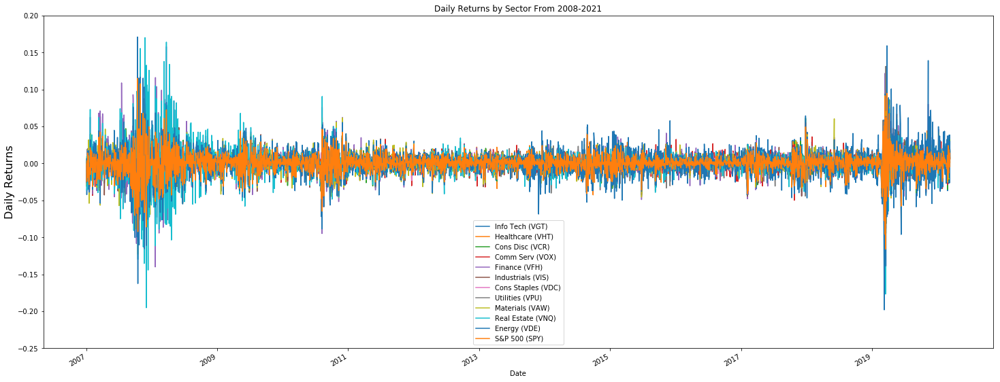

In [15]:
# Create daily returns plot with function for dashboard
def sectors_returns_plot():
    returns_plot = sectors_returns.plot(
        title='Daily Returns by Sector From 2008-2021', 
        figsize=(25,10),
        ylim=(-0.25,0.20)
         ).set_ylabel('Daily Returns', fontsize=16)
    return returns_plot

# Define .plot variable outside of function as backup for panel helper function
returns_plot = sectors_returns.plot(
    title='Daily Returns by Sector From 2008-2021', 
    figsize=(25,10),
    ylim=(-0.25,0.20)
     ).set_ylabel('Daily Returns', fontsize=16)

In [16]:
# Calculate cumulative returns by sector
sectors_cump = (1 + sectors_returns).cumprod()
sectors_cump.head()

,Info Tech (VGT),Healthcare (VHT),Cons Disc (VCR),Comm Serv (VOX),Finance (VFH),Industrials (VIS),Cons Staples (VDC),Utilities (VPU),Materials (VAW),Real Estate (VNQ),Energy (VDE),S&P 500 (SPY)
Date,,,,,,,,,,,,
2008-01-03 00:00:00-05:00,0.994916,1.004323,0.984843,0.996223,0.991259,1.002363,0.994714,1.000231,1.009062,0.963930,1.006374,0.999377
2008-01-04 00:00:00-05:00,0.952889,0.993681,0.954144,0.973294,0.963869,0.975678,0.985998,1.000808,0.979927,0.929329,0.981053,0.974957
2008-01-07 00:00:00-05:00,0.943908,1.012138,0.956830,0.984624,0.968337,0.968172,1.003000,1.020208,0.967538,0.938795,0.968218,0.978623
2008-01-08 00:00:00-05:00,0.918319,1.018457,0.936685,0.950769,0.933372,0.942321,0.997714,1.019169,0.947924,0.905663,0.954684,0.960291
2008-01-09 00:00:00-05:00,0.934248,1.034087,0.942057,0.954276,0.948135,0.948436,1.006429,1.030716,0.954577,0.920842,0.970052,0.973919


In [17]:
# Create cumulative returns plot with function for dashboard
def sectors_cump_plot():
    cump_plot = sectors_cump.hvplot(
    label='Cumulative Returns by Sector From 2008-2021', 
    ylabel='Cumulative Returns',
    width=1000,
    height=500,
    ylim=(0,7),
    group_label = "Sector"
    )
    return pn.pane.HoloViews(cump_plot, linked_axes=False)

sectors_cump_plot()

HoloViews(NdOverlay, linked_axes=False)

In [18]:
# Create daily returns boxplot with function for dashboard
def sectors_returns_boxplot():
    returns_boxplot = sectors_returns.hvplot.box(
        xlabel="Sectors",
        ylabel="Daily Return",
        title="Daily Returns From 2008-2021 by Sector",
        width=800,
        height=450,
#         ylim=(-0.2,0.2),
        rot=60,
        color="blue"
    )
    return pn.pane.HoloViews(returns_boxplot, linked_axes=False)
    
sectors_returns_boxplot()

HoloViews(BoxWhisker, linked_axes=False)

In [19]:
# Create cumulative return boxplot with function for dashboard
def sectors_cump_boxplot():
    cumprod_boxplot = sectors_cump.hvplot.box(
        xlabel="Sectors",
        ylabel="Cumulative Return",
        title="Cumulative Returns From 2008-2021 by Sector",
        width=800,
        height=500,
        ylim=(0,7),
        rot=60,
        color="green"
    )
    return pn.pane.HoloViews(cumprod_boxplot, linked_axes=False)

sectors_cump_boxplot()

HoloViews(BoxWhisker, linked_axes=False)

In [20]:
# Calculate standard deviation
sectors_std = sectors_returns.std()
sectors_std = sectors_std.sort_values(ascending=False)
sectors_std

Real Estate (VNQ)     0.020854
Energy (VDE)          0.020292
Finance (VFH)         0.019801
Materials (VAW)       0.016632
Industrials (VIS)     0.015038
Info Tech (VGT)       0.014669
Cons Disc (VCR)       0.014456
Comm Serv (VOX)       0.013794
S&P 500 (SPY)         0.013086
Utilities (VPU)       0.012563
Healthcare (VHT)      0.011846
Cons Staples (VDC)    0.009760
dtype: float64

In [21]:
# Calculate annualized standard deviation
annualized_std = sectors_std * np.sqrt(252)
annualized_std = annualized_std.sort_values(ascending=False)
annualized_std

Real Estate (VNQ)     0.331050
Energy (VDE)          0.322130
Finance (VFH)         0.314331
Materials (VAW)       0.264019
Industrials (VIS)     0.238713
Info Tech (VGT)       0.232860
Cons Disc (VCR)       0.229484
Comm Serv (VOX)       0.218972
S&P 500 (SPY)         0.207732
Utilities (VPU)       0.199439
Healthcare (VHT)      0.188042
Cons Staples (VDC)    0.154934
dtype: float64

In [22]:
# Calculate rolling standard deviation for a 50-day window
rolling_std = sectors_returns.rolling(window=50).std()
rolling_std.tail()

,Info Tech (VGT),Healthcare (VHT),Cons Disc (VCR),Comm Serv (VOX),Finance (VFH),Industrials (VIS),Cons Staples (VDC),Utilities (VPU),Materials (VAW),Real Estate (VNQ),Energy (VDE),S&P 500 (SPY)
Date,,,,,,,,,,,,
2021-03-04 00:00:00-05:00,0.014516,0.009255,0.012063,0.012210,0.014026,0.012053,0.007046,0.011024,0.013801,0.010094,0.021862,0.009639
2021-03-05 00:00:00-05:00,0.014688,0.009593,0.012148,0.012458,0.014168,0.012447,0.007794,0.011230,0.014187,0.010174,0.022044,0.009944
2021-03-08 00:00:00-05:00,0.015060,0.009634,0.012153,0.012583,0.014139,0.012476,0.007757,0.011434,0.014288,0.010184,0.021810,0.009969
2021-03-09 00:00:00-05:00,0.015988,0.009784,0.012936,0.012662,0.014098,0.012466,0.007737,0.011539,0.014305,0.010164,0.022011,0.010143
2021-03-10 00:00:00-05:00,0.015974,0.009784,0.012956,0.012674,0.014253,0.012634,0.007925,0.011549,0.014475,0.010183,0.022163,0.010161


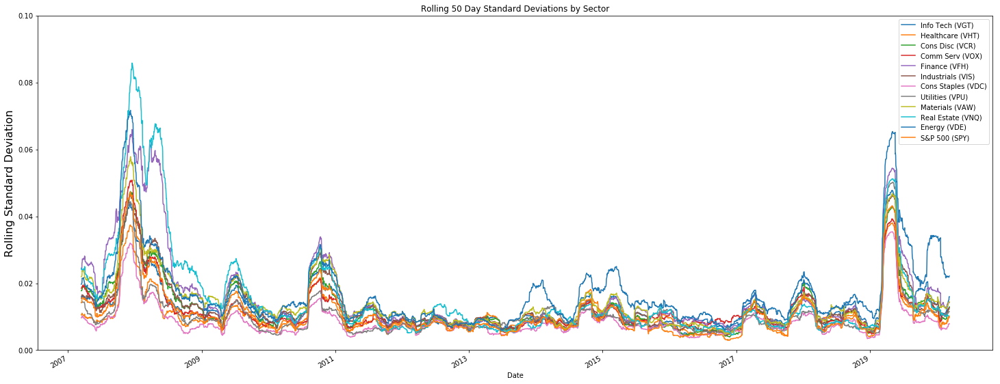

In [23]:
# Create rolling standard deviation with function for dashboard
def rolling_std_plot():
    rolling_std = sectors_returns.rolling(window=50).std()
    rolling_std_plot = rolling_std.plot(
        figsize=(25,10), 
        title='Rolling 50 Day Standard Deviations by Sector',
        ylim=(0,0.10)
    ).set_ylabel('Rolling Standard Deviation', fontsize=16)
    return pn.Column(rolling_std_plot.figure)

# Define .plot variable outside of function as backup for panel helper function
rolling_std = sectors_returns.rolling(window=50).std()
rolling_std_plot = rolling_std.plot(
    figsize=(25,10), 
    title='Rolling 50 Day Standard Deviations by Sector',
    ylim=(0,0.10)
).set_ylabel('Rolling Standard Deviation', fontsize=16)

In [24]:
# Calculate correlation
sectors_corr = sectors_returns.corr()
sectors_corr

,Info Tech (VGT),Healthcare (VHT),Cons Disc (VCR),Comm Serv (VOX),Finance (VFH),Industrials (VIS),Cons Staples (VDC),Utilities (VPU),Materials (VAW),Real Estate (VNQ),Energy (VDE),S&P 500 (SPY)
Info Tech (VGT),1.000000,0.793519,0.883637,0.805802,0.744899,0.846995,0.738670,0.600479,0.810212,0.671945,0.680446,0.924362
Healthcare (VHT),0.793519,1.000000,0.787647,0.754600,0.696249,0.785810,0.788600,0.658993,0.736519,0.612670,0.643208,0.868034
Cons Disc (VCR),0.883637,0.787647,1.000000,0.832654,0.825580,0.896235,0.770423,0.610902,0.832002,0.763321,0.695395,0.926367
Comm Serv (VOX),0.805802,0.754600,0.832654,1.000000,0.746909,0.800194,0.755566,0.652180,0.759857,0.688189,0.671280,0.863645
Finance (VFH),0.744899,0.696249,0.825580,0.746909,1.000000,0.856175,0.682278,0.576356,0.785014,0.836047,0.689696,0.874769
Industrials (VIS),0.846995,0.785810,0.896235,0.800194,0.856175,1.000000,0.774263,0.658438,0.907650,0.753294,0.792698,0.934192
Cons Staples (VDC),0.738670,0.788600,0.770423,0.755566,0.682278,0.774263,1.000000,0.766697,0.719474,0.662636,0.618135,0.843980
Utilities (VPU),0.600479,0.658993,0.610902,0.652180,0.576356,0.658438,0.766697,1.000000,0.640226,0.627663,0.595190,0.723915
Materials (VAW),0.810212,0.736519,0.832002,0.759857,0.785014,0.907650,0.719474,0.640226,1.000000,0.702089,0.829800,0.889307
Real Estate (VNQ),0.671945,0.612670,0.763321,0.688189,0.836047,0.753294,0.662636,0.627663,0.702089,1.000000,0.579732,0.776552


In [25]:
# Create correlation heatmap function for dashboard
def corr_heatmap():
    heatmap = px.imshow(
        sectors_corr,
        title="All Sectors Correlation Heatmap",
        color_continuous_scale=px.colors.sequential.Blues,
        width=900,
        height=600,
        zmin=0.6,
        zmax=1
    )
    return heatmap

In [26]:
# Calculate the covariance of a single portfolio
tech_cov = sectors_cump["Info Tech (VGT)"].rolling(window=50).cov(sectors_cump["S&P 500 (SPY)"])

# Calculate the variance of the S&P 500
sp_var = sectors_cump["S&P 500 (SPY)"].rolling(window=50).var()

# Compute beta
beta = tech_cov/sp_var

# Create beta plot with function for dashboard
def sectors_beta_plot():
    sp_plot = sectors_cump["S&P 500 (SPY)"].hvplot(label="S&P 500")
    beta_plot = beta.hvplot(label="Tech Sector")
    combined_plot = sp_plot * beta_plot
    combined_plot.opts(
        title='Tech Sector Beta vs S&P Cummulative Returns From 2008-2021',
        width=800,
        height=500,
        ylabel="Value"
    )
    return combined_plot

sectors_beta_plot()

:Overlay
   .Curve.S_ampersand_P_500 :Curve   [Date]   (S&P 500 (SPY))
   .Curve.Tech_Sector       :Curve   [Date]   (0)

In [27]:
# Annualized Sharpe Ratios
sectors_sharpe_ratios = (sectors_returns.mean() * 252) / (sectors_returns.std() * np.sqrt(252))
sectors_sharpe_ratios

Info Tech (VGT)       0.698927
Healthcare (VHT)      0.625833
Cons Disc (VCR)       0.683814
Comm Serv (VOX)       0.308082
Finance (VFH)         0.280315
Industrials (VIS)     0.421038
Cons Staples (VDC)    0.520104
Utilities (VPU)       0.271206
Materials (VAW)       0.327112
Real Estate (VNQ)     0.252164
Energy (VDE)          0.059680
S&P 500 (SPY)         0.467054
dtype: float64

In [28]:
# Create Sharpe Ratio plot with function for dashboard
def sector_sharpe_plot():
    sharpe_ratios_plot = sectors_sharpe_ratios.hvplot.bar(
        xlabel="Sectors",
        ylabel="Sharpe Ratio",
        title="Sharpe Ratios by Sector",
        width=800,
        height=500,
        rot=60,
        color="purple"
    )
    return sharpe_ratios_plot

sector_sharpe_plot()

:Bars   [index]   (0)

## Monte Carlo Simulation

In [29]:
# Clean data and drop columns not used in portfolio
portfolio_df = sectors_df.sort_index()
portfolio_df = portfolio_df.dropna()
portfolio_df = portfolio_df.drop_duplicates()
portfolio_df = portfolio_df.drop(columns = ["SPY"])

# Preview DataFrame
portfolio_df.head()

VAW                                   VCR         \
                            open   high    low  close    volume   open   high   
time                                                                            
2008-01-02 00:00:00-05:00  87.61  88.26  86.68  87.18   43027.0  53.13  53.25   
2008-01-03 00:00:00-05:00  87.80  88.64  87.58  87.97   18500.0  52.25  52.25   
2008-01-04 00:00:00-05:00  86.46  86.63  85.34  85.43   50000.0  50.74  50.74   
2008-01-07 00:00:00-05:00  85.66  86.00  83.22  84.35  155001.0  50.01  50.24   
2008-01-08 00:00:00-05:00  85.12  85.71  82.64  82.64  104400.0  50.08  50.29   

                                                   ...    VOX                \
                             low  close    volume  ...   open   high    low   
time                                               ...                        
2008-01-02 00:00:00-05:00  52.07  52.12   66200.0  ...  74.99  75.70  73.82   
2008-01-03 00:00:00-05:00  51.33  51.33   63100.0  ...  74.10  74.54  73.67   
2008-01-04 00:00:00-05:00  49.62  49.73   95100.0  ...  73.54  73.55  72.13   
2008-01-07 00:00:00-05:00  49.40  49.87  237000.0  ...  72.44  73.36  72.07   
2008-01-08 00:00:00-05:00  48.78  48.82  124700.0  ...  73.50  74.47  69.81   

                                              VPU                       \
                           close    volume   open   high    low  close   
time                                                                     
2008-01-02 00:00:00-05:00  74.14   28650.0  87.61  87.88  86.26  86.60   
2008-01-03 00:00:00-05:00  73.86   24900.0  86.85  87.50  86.58  86.62   
2008-01-04 00:00:00-05:00  72.16   29400.0  87.12  87.32  85.98  86.67   
2008-01-07 00:00:00-05:00  73.00   94500.0  86.66  88.38  86.66  88.35   
2008-01-08 00:00:00-05:00  70.49  110000.0  88.52  89.74  88.21  88.26   

                                     
                             volume  
time                                 
2008-01-02 00:00:00-05:00  119200.0  
2008-01-03 00:00:00-05:00   15400.0  
2008-01-04 00:00:00-05:00   51700.0  
2008-01-07 00:00:00-05:00  149301.0  
2008-01-08 00:00:00-05:00  124020.0  

[5 rows x 55 columns]

In [30]:
# Configure Monte Carlo simulation to forecast 20 years
MC_20years = MCSimulation(
    portfolio_data = portfolio_df,
    num_simulation = 500,
    num_trading_days = 252*20
)

In [31]:
# Running a Monte Carlo simulation to forecast 20 years cumulative returns
MC_20years.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.999805,1.003712,0.991925,0.994613,0.992250,1.006533,0.997952,1.004825,1.000812,1.001242,...,0.995800,1.009344,1.009658,1.008625,0.999510,0.996349,0.994674,1.009211,1.000878,1.004916
2,0.998698,1.007369,0.984704,0.999629,0.998042,1.005000,0.996378,1.005374,0.999644,1.009397,...,1.005247,1.014184,1.017030,1.009197,0.997133,0.997519,0.996869,1.006691,1.002461,0.998729
3,0.992315,0.998372,0.983496,0.996455,1.001570,1.006632,0.994434,1.012152,1.001293,1.010623,...,1.008730,1.018436,1.030029,1.013573,0.995911,0.986334,0.991483,1.003180,1.000007,0.995967
4,0.999018,1.000768,0.988773,1.001906,1.000171,1.007432,0.995516,1.005606,1.000819,1.012522,...,1.014471,1.020807,1.032338,1.019033,0.991654,0.988172,0.998017,1.004632,0.987228,0.996565
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5036,5.317746,6.516583,9.944852,7.413116,11.235639,3.713690,4.000903,5.449729,8.796926,4.701651,...,6.840565,8.673586,8.424039,6.731231,3.030799,6.829326,5.218831,4.114750,6.632005,4.899956
5037,5.322892,6.577270,9.974845,7.453271,11.271240,3.769734,3.989614,5.492232,8.860786,4.681491,...,6.771380,8.624082,8.421119,6.640321,3.035522,6.844916,5.223069,4.144349,6.673847,4.946595
5038,5.340294,6.583634,9.971338,7.473835,11.233601,3.770450,4.003036,5.499581,8.816044,4.697788,...,6.800801,8.659172,8.431924,6.604346,3.044087,6.850798,5.249602,4.146729,6.647646,4.945469
5039,5.334284,6.562963,9.921750,7.487941,11.350932,3.763188,4.024840,5.545474,8.843170,4.700666,...,6.831339,8.731596,8.430661,6.627215,3.060401,6.820032,5.203140,4.169552,6.620865,4.911750


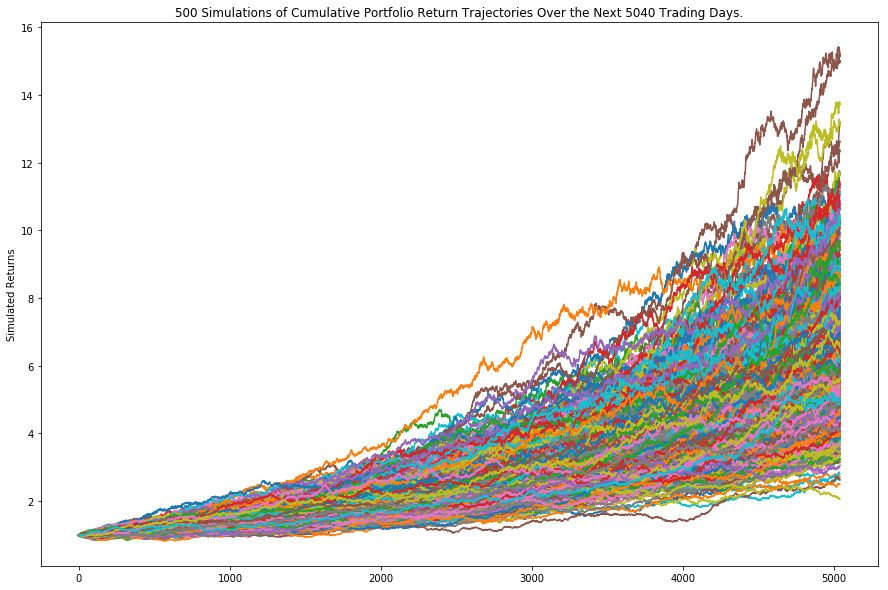

In [32]:
# Plot simulation outcomes and create function for dashboard
def mc_plot_simulation():
    mc_plot_sim = MC_20years.plot_simulation().set_ylabel('Simulated Returns')
    return pn.Column(mc_plot_sim.figure)

# Define .plot variable outside of function as backup for panel helper function
mc_plot_sim = MC_20years.plot_simulation().set_ylabel('Simulated Returns')

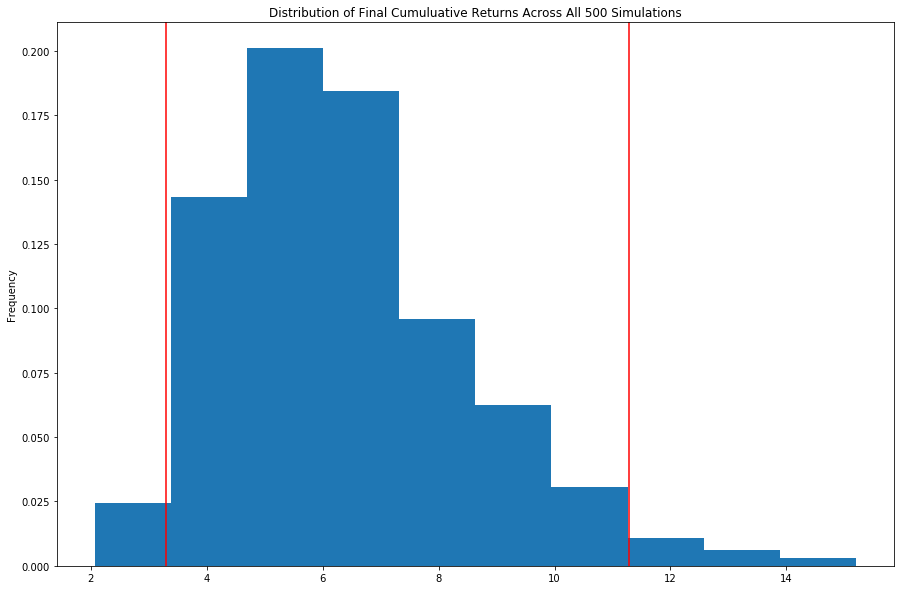

In [33]:
# Plot probability distribution and confidence intervals and create function for dashboard
def mc_plot_distribution():
    mc_plot_dist = MC_20years.plot_distribution()
    return pn.Column(mc_plot_dist.figure)

# Define .plot variable outside of function as backup for panel helper function
mc_plot_dist = MC_20years.plot_distribution()

In [34]:
# Fetch summary statistics from the Monte Carlo simulation results
MC_stats = MC_20years.summarize_cumulative_return()
MC_stats

count           500.000000
mean              6.376760
std               2.124045
min               2.067925
25%               4.820456
50%               6.114312
75%               7.484107
max              15.198127
95% CI Lower      3.301899
95% CI Upper     11.289680
Name: 5040, dtype: float64

In [35]:
# Creating our portfolio
our_portfolio_df = sectors_df.sort_index()
our_portfolio_df = our_portfolio_df.dropna()
our_portfolio_df = our_portfolio_df.drop_duplicates()
our_portfolio_df = our_portfolio_df.drop(columns = ["SPY", "VOX", "VFH", "VIS", "VDC", "VPU", "VAW", "VNQ", "VDE"])
our_portfolio_df

VCR                                       \
                             open      high      low   close    volume   
time                                                                     
2008-01-02 00:00:00-05:00   53.13   53.2500   52.070   52.12   66200.0   
2008-01-03 00:00:00-05:00   52.25   52.2500   51.330   51.33   63100.0   
2008-01-04 00:00:00-05:00   50.74   50.7400   49.620   49.73   95100.0   
2008-01-07 00:00:00-05:00   50.01   50.2400   49.400   49.87  237000.0   
2008-01-08 00:00:00-05:00   50.08   50.2900   48.780   48.82  124700.0   
...                           ...       ...      ...     ...       ...   
2021-03-04 00:00:00-05:00  281.08  283.1700  269.630  275.10  223591.0   
2021-03-05 00:00:00-05:00  277.07  278.4200  264.510  278.08  241377.0   
2021-03-08 00:00:00-05:00  279.23  284.1771  278.395  279.05  281322.0   
2021-03-09 00:00:00-05:00  284.97  289.7200  283.444  287.96  124348.0   
2021-03-10 00:00:00-05:00  291.51  293.3000  287.390  289.78  213689.0   

                              VGT                                       \
                             open      high     low   close     volume   
time                                                                     
2008-01-02 00:00:00-05:00   60.79   60.7900   58.65   59.01   144000.0   
2008-01-03 00:00:00-05:00   58.66   59.1600   58.44   58.71    82908.0   
2008-01-04 00:00:00-05:00   58.08   58.0800   56.10   56.23   115125.0   
2008-01-07 00:00:00-05:00   56.06   56.3200   55.00   55.70   357678.0   
2008-01-08 00:00:00-05:00   55.82   56.2700   54.18   54.19   322349.0   
...                           ...       ...     ...     ...        ...   
2021-03-04 00:00:00-05:00  350.68  353.0206  338.46  343.04  1144271.0   
2021-03-05 00:00:00-05:00  347.15  349.3300  335.60  348.40  1022880.0   
2021-03-08 00:00:00-05:00  347.96  350.1400  339.12  339.23   796336.0   
2021-03-09 00:00:00-05:00  348.40  354.6100  347.67  352.26  1107215.0   
2021-03-10 00:00:00-05:00  357.01  357.0100  350.65  350.83   656196.0   

                              VHT                                     
                             open     high     low   close    volume  
time                                                                  
2008-01-02 00:00:00-05:00   60.04   60.900   59.88   60.14  157500.0  
2008-01-03 00:00:00-05:00   60.60   60.630   60.22   60.40   40120.0  
2008-01-04 00:00:00-05:00   60.35   60.350   59.76   59.76   31600.0  
2008-01-07 00:00:00-05:00   60.24   60.950   60.24   60.87  121000.0  
2008-01-08 00:00:00-05:00   60.95   62.200   60.95   61.25  143200.0  
...                           ...      ...     ...     ...       ...  
2021-03-04 00:00:00-05:00  222.00  222.825  216.25  218.27  577214.0  
2021-03-05 00:00:00-05:00  219.65  222.990  216.28  222.33  261613.0  
2021-03-08 00:00:00-05:00  222.96  224.740  220.97  220.97  165586.0  
2021-03-09 00:00:00-05:00  223.02  226.785  223.02  223.65  170563.0  
2021-03-10 00:00:00-05:00  225.20  226.410  223.91  223.91  245473.0  

[3315 rows x 15 columns]

In [36]:
# Configure Monte Carlo simulation to forecast 20 years for our portfolio
MC_portfolio = MCSimulation(
    portfolio_data = our_portfolio_df,
    num_simulation = 500,
    num_trading_days = 252*20
)

In [37]:
# Running a Monte Carlo simulation for our portfolio to forecast 20 years cumulative returns
MC_portfolio.calc_cumulative_return()

Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.
Running Monte Carlo simulation number 100.
Running Monte Carlo simulation number 110.
Running Monte Carlo simulation number 120.
Running Monte Carlo simulation number 130.
Running Monte Carlo simulation number 140.
Running Monte Carlo simulation number 150.
Running Monte Carlo simulation number 160.
Running Monte Carlo simulation number 170.
Running Monte Carlo simulation number 180.
Running Monte Carlo simulation number 190.
Running Monte Carlo simulation number 200.
Running Monte Carlo simulation number 210.
Running Monte Carlo simulation number 220.
Running Monte Carlo si

,0,1,2,3,4,5,6,7,8,9,...,490,491,492,493,494,495,496,497,498,499
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.009152,0.999461,1.006996,0.991771,1.014701,0.996975,1.008673,1.001063,0.996774,0.993619,...,0.996594,0.996992,1.003181,0.998220,0.996721,1.001034,0.988796,0.982801,1.002090,0.985209
2,1.020759,0.996366,1.000194,1.002913,1.034929,1.002252,1.017790,1.010050,1.000205,1.009825,...,0.992978,0.990446,0.996487,0.990096,0.996075,1.004488,0.994086,0.982530,1.004787,0.980265
3,1.017426,0.994515,1.004145,0.994998,1.042116,0.985384,1.027301,1.009213,0.999476,1.011617,...,0.990632,1.001191,1.000076,0.990442,1.008206,1.005598,0.988370,0.977212,1.001277,0.989539
4,1.015878,0.992209,0.997204,1.001904,1.042288,0.987327,1.034328,1.008365,1.001909,1.013291,...,0.990458,1.005949,1.007183,0.988876,1.009274,1.007690,0.986476,0.990829,1.014516,0.993925
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5036,17.468779,12.646048,52.415332,11.679382,8.034879,14.957900,20.708626,11.303451,7.820837,8.610411,...,18.369138,19.594326,13.735403,9.051347,15.489081,23.497878,33.086251,11.162241,14.728184,42.255001
5037,17.502184,12.802959,52.590315,11.834970,8.039935,15.135236,20.298314,11.259516,7.824054,8.772105,...,18.481480,19.439798,13.580724,9.082830,15.585998,23.517163,32.857947,11.129191,14.634150,42.466522
5038,17.462254,12.721925,52.138662,11.904084,8.167550,14.966370,20.207132,11.147336,7.915583,8.838417,...,18.608425,19.664760,13.494035,9.166528,15.529692,23.124365,32.961819,11.177808,14.730677,42.534078
5039,17.522061,12.832783,52.132499,12.070083,8.172045,14.914666,20.354828,11.161204,7.912101,8.870916,...,18.568084,19.697012,13.330161,9.132654,15.581693,23.177120,32.709124,11.059331,14.560744,42.883704


Text(0, 0.5, 'Simulated Returns')

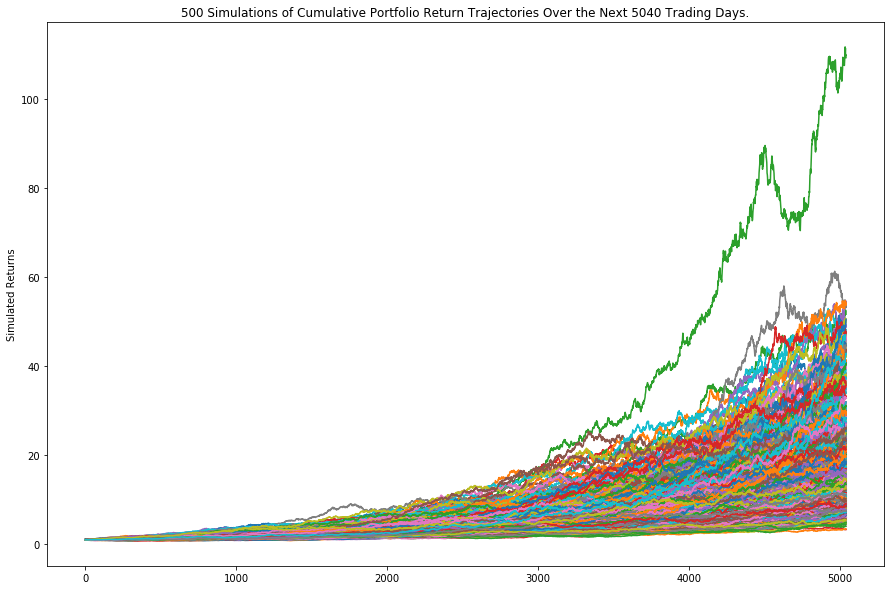

In [38]:
# Plot simulation outcomes for our portfolio and create function for dashboard
def mc_portfolio_simulation():
    mc_portfolio_sim = MC_portfolio.plot_simulation().set_ylabel('Simulated Returns')
    return pn.Column(mc_portfolio_sim.figure)

# Define .plot variable outside of function as backup for panel helper function
mc_portfolio_sim = MC_portfolio.plot_simulation().set_ylabel('Simulated Returns')
mc_portfolio_sim

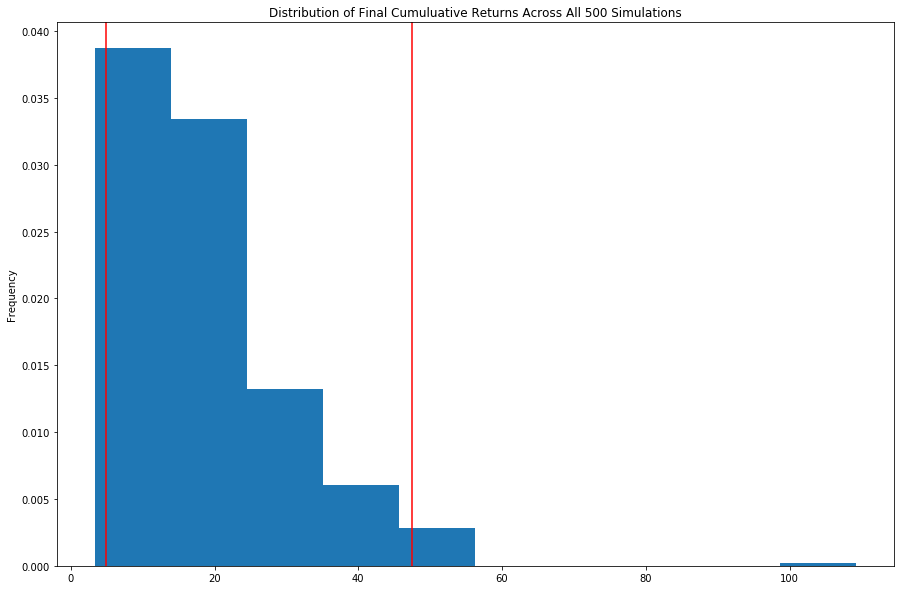

In [39]:
# Plot probability distribution and confidence intervals for our portfolio and create function for dashboard
def mc_portfolio_distribution():
    mc_portfolio_dist = MC_portfolio.plot_distribution()
    return pn.Column(mc_portfolio_dist.figure)

# Define .plot variable outside of function as backup for panel helper function
mc_portfolio_dist = MC_portfolio.plot_distribution()
mc_portfolio_dist

In [40]:
# Fetch summary statistics from the Monte Carlo simulation results
MC_portfolio_stats = MC_portfolio.summarize_cumulative_return()
MC_portfolio_stats

count           500.000000
mean             18.753457
std              11.217617
min               3.333375
25%              11.017949
50%              16.193231
75%              23.723623
max             109.204069
95% CI Lower      4.952281
95% CI Upper     47.508061
Name: 5040, dtype: float64

In [41]:
# Define initial investment variable
initial_investment = 20000

## Create Panel Dashboard

In [42]:
# Create Panel columns

intro_col = pn.Column(
    "# Welcome!",
    "## S&P 500 Sector Growth From 2008-2021",
    stacked_bar_chart()
)


closing_col = pn.Column(
    "# Closing Prices by Sector",
    sectors_closing_plot(),
    closing_plot_stacked()
)

daily_returns_col = pn.Column(
    "# Daily Returns by Sector",
    pn.Column(returns_plot.figure),
    sectors_returns_boxplot()
)

cump_returns_col = pn.Column(
    "# Cumulative Return by Sector",
    sectors_cump_plot(),
    sectors_cump_boxplot()
)

rolling_std_col = pn.Column(
    "# Rolling 50 Day Standard Deviation by Sector",
    pn.Column(rolling_std_plot.figure),
)

corr_col = pn.Column(
    "# Sector Correlation",
    corr_heatmap()
)

sharpe_ratio_col = pn.Column(
    "# Sharpe Ratios by Sector",
    sector_sharpe_plot()
)

mc_col = pn.Column(
    "# Monte Carlo Simulation", 
    "## Results for a portfolio evenly distributed across all sectors",
    pn.Column(mc_plot_sim.figure),
    pn.Column(mc_plot_dist.figure),
    f"There is a 95% chance with an initial investment of ${initial_investment} in the \
    portfolio over 20 years will end within the range of \
    ${round(MC_stats[8] * initial_investment,2)} to ${round(MC_stats[9] * initial_investment,2)}"
)

conclusion_col = pn.Column(
    "# Conclusions",
    pn.Column(mc_portfolio_sim.figure),
    pn.Column(mc_portfolio_dist.figure),
    f"There is a 95% chance with an initial investment of ${initial_investment} in the \
    portfolio over 20 years will end within the range of \
    ${round(MC_portfolio_stats[8] * initial_investment,2)} to \
    ${round(MC_portfolio_stats[9] * initial_investment,2)}.",
    f"Therefore, our portfolio which is evenly weighted across the Info Tech, \
    Consumer Discretionary and Healthcare sectors, far outperforms a portfolio distributed \
    across all sectors."
)

Tabs
    [0] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] HoloViews(Bars, linked_axes=False)
    [1] Column
        [0] Markdown(str)
        [1] HoloViews(NdOverlay, linked_axes=False)
        [2] HoloViews(Bars, linked_axes=False)
    [2] Column
        [0] Markdown(str)
        [1] Column
            [0] Matplotlib(Figure)
        [2] HoloViews(BoxWhisker, linked_axes=False)
    [3] Column
        [0] Markdown(str)
        [1] HoloViews(NdOverlay, linked_axes=False)
        [2] HoloViews(BoxWhisker, linked_axes=False)
    [4] Column
        [0] Markdown(str)
        [1] Column
            [0] Matplotlib(Figure)
    [5] Column
        [0] Markdown(str)
        [1] Plotly(Figure)
    [6] Column
        [0] Markdown(str)
        [1] HoloViews(Bars)
    [7] Column
        [0] Markdown(str)
        [1] Markdown(str)
        [2] Column
            [0] Matplotlib(Figure)
        [3] Column
            [0] Matplotlib(Figure)
        [4] Markdown(str)
    [8] Column
        [0] Markdown(str)
        [1] Column
            [0] Matplotlib(Figure)
        [2] Column
            [0] Matplotlib(Figure)
        [3] Markdown(str)
        [4] Markdown(str)
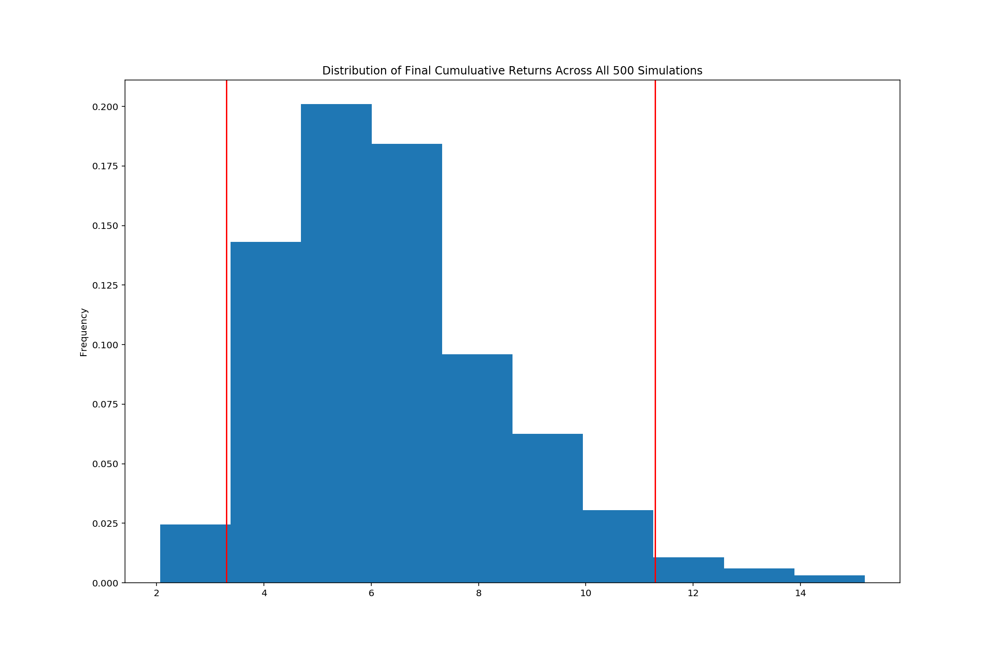
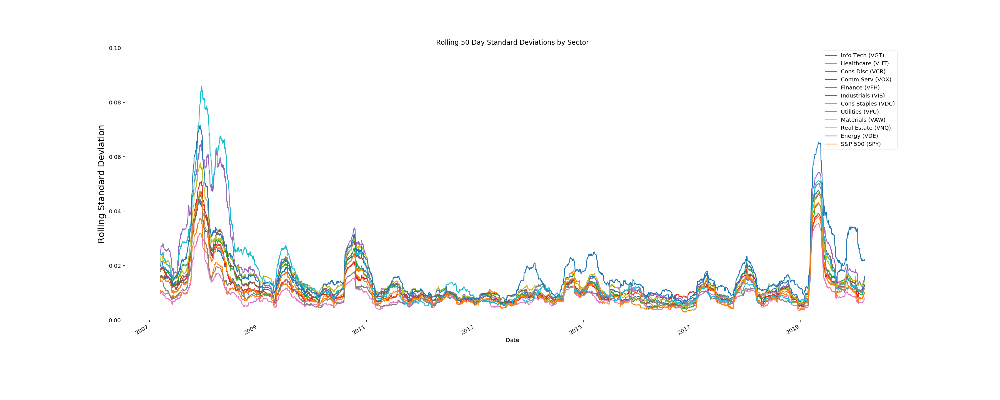
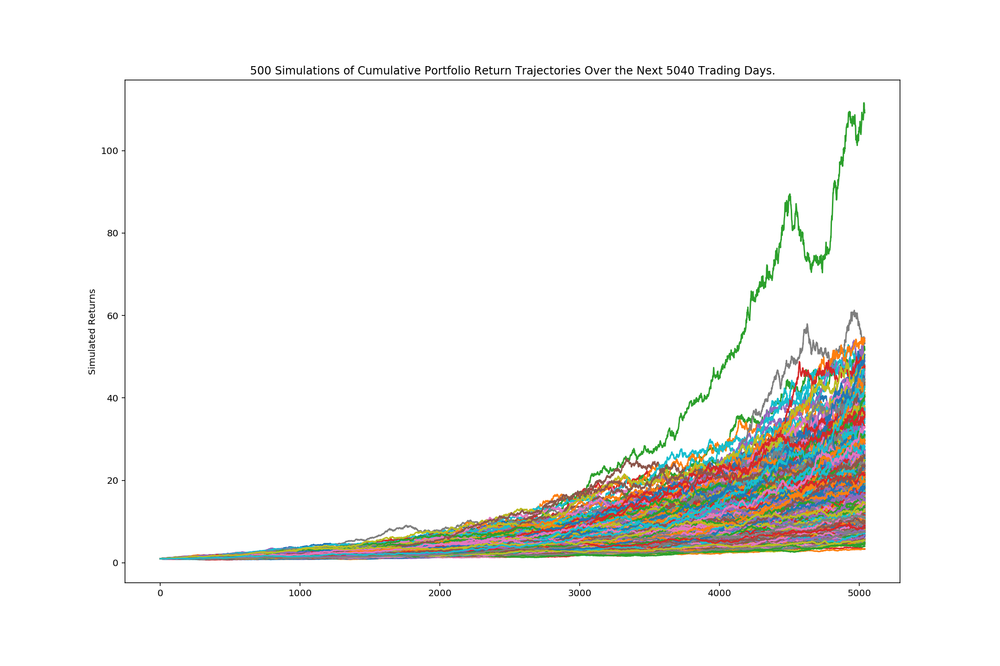
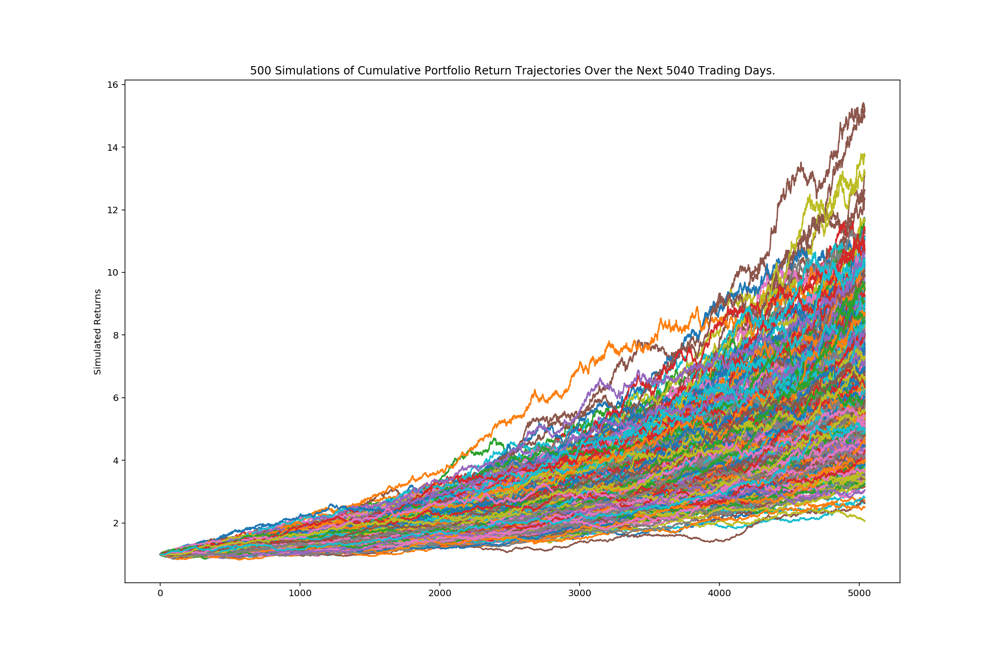
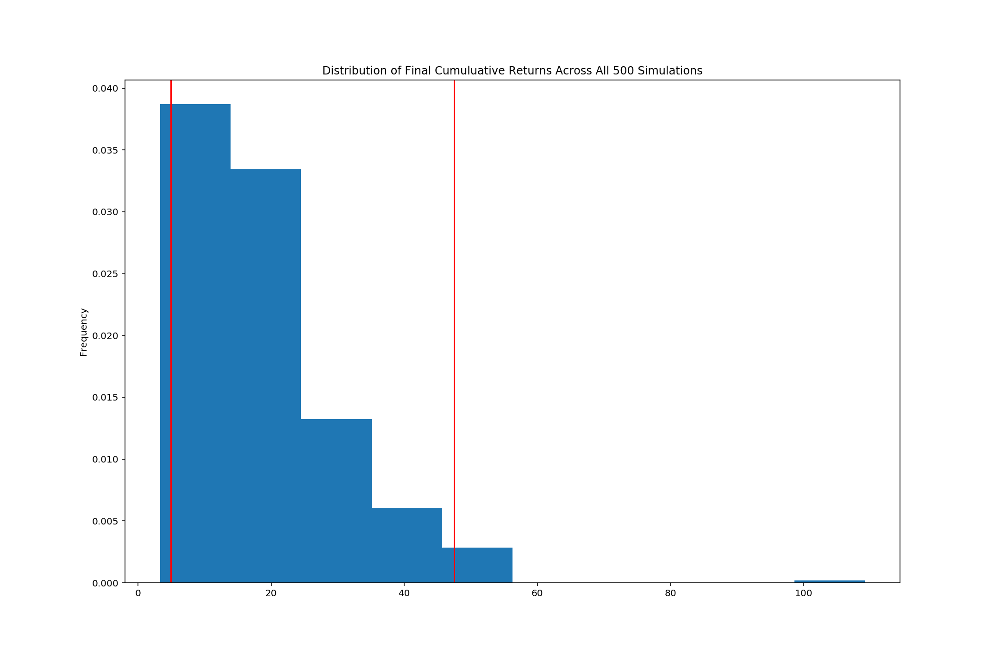
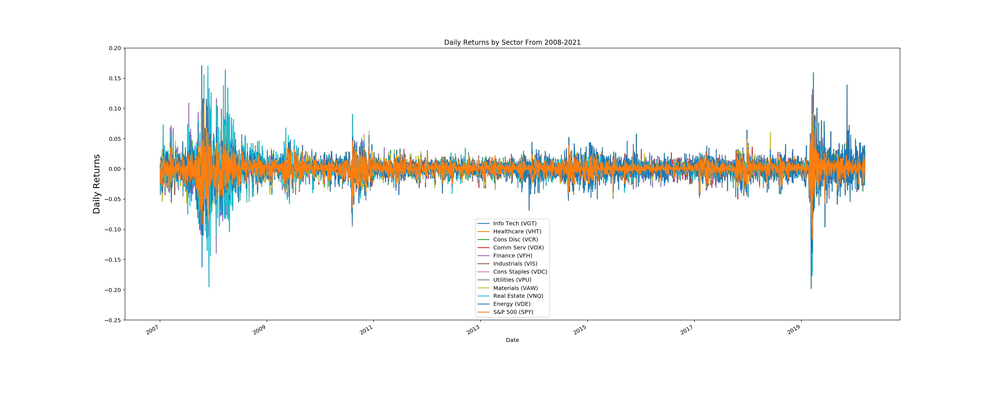

In [43]:
# Create dashboard
sectors_dashboard = pn.Tabs(
    ("Introduction", intro_col),
    ("Closing Prices", closing_col),
    ("Daily Returns", daily_returns_col),
    ("Cumulative Returns", cump_returns_col),
    ("Standard Dev.", rolling_std_col),
    ("Correlation", corr_col),
    ("Sharpe Ratio", sharpe_ratio_col),
    ("Monte Carlo", mc_col),
    ("Conclusions", conclusion_col)
)

pn.panel(sectors_dashboard, linked_axes=False)